# End-to-end Multi-class Dog Breed Classification

This notebook builds a multi-class image classifier using Tensorflow.

## 1. Problem
Identifying the dog breed when given an image of a dog.

## 2. Data
The data used in this project is sourced from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each of the different breeds.

## 4. Features
Information about the data:
* Dealing with unstrcutured data (images), therefore, deep learning or transfer learning will be used.
* There are 120 breeds of dogs (there are a 120 different classes).
* There are 10,000+ images in the training set (these images have labels).
* There are 10,000+ images in the test set (these images do not have labels, since they need to be predicted).








## Getting the workspace ready

* Import Tensorflow 2.0
* Import Tensorflow Hub
* Make sure a GPU is being used

In [3]:
#  Importing Tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print('"TF Version:', tf.__version__)
print('"TF Hub Version:', hub.__version__)

# Check for GPU availability
print("GPU", "Yes" if tf.config.list_physical_devices("GPU") else "No")

"TF Version: 2.15.0
"TF Hub Version: 0.15.0
GPU Yes


## Getting data ready

Turning data into tensors (numerical representations) since with all machine learning models, data has to be in numerical format



In [4]:
import pandas as pd

In [5]:
labels_csv = pd.read_csv("/content/drive/MyDrive/dog_vision/labels.csv")

In [6]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

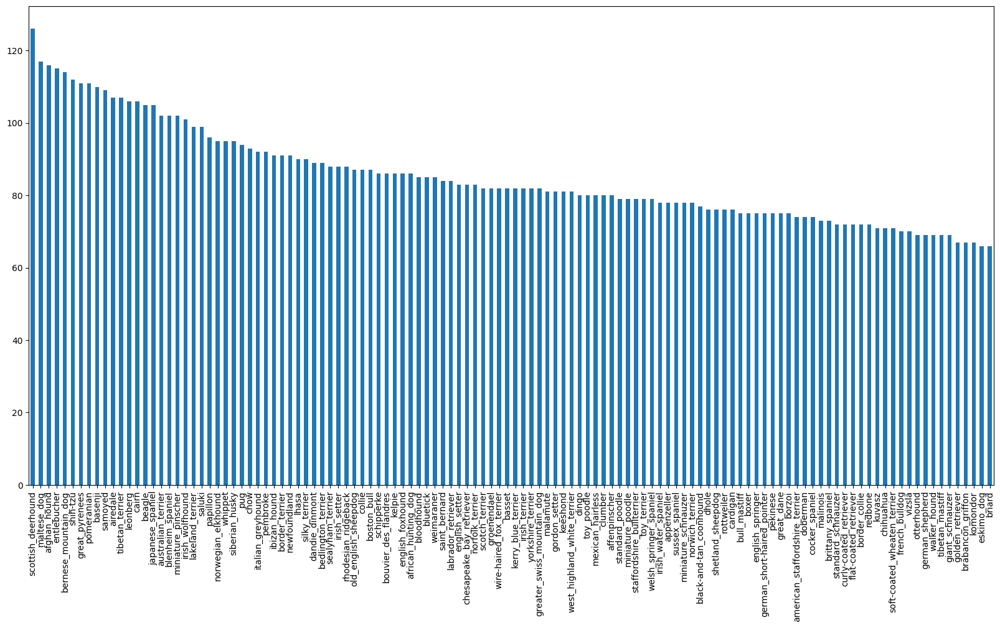

In [8]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [9]:
labels_csv['breed'].value_counts().median()

82.0

In [10]:
filenames = ["drive/MyDrive/dog_vision/train/" + fname for fname in labels_csv['id']+".jpg"]
filenames[:10]

['drive/MyDrive/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
import os
if len(os.listdir('drive/MyDrive/dog_vision/train/')) == len(filenames):
  print('Number of files match')
else:
  print('Error')

Number of files match


In [12]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
if len(labels) == len(filenames):
  print('Ok')
else:
  print('Not ok')

Ok


In [14]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [18]:
X = filenames
y = boolean_labels

In [19]:
len(filenames)

10222

In [20]:
NUM_IMAGES = 1000

In [21]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [22]:
X_train[:5], y_train[:1]

(['drive/MyDrive/dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning data into Tensors)

1. Take an image file as input
2. Use TensorFlow to read the file and save it to a variable., `image`
3. Turn `image` (jpg) into Tensors.
4. Resize the `image` to be a shape (224, 224).
5. Return modified `image`


In [23]:
from matplotlib.pyplot import imread
image = imread(filenames[0])
image.shape

(375, 500, 3)

In [24]:
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

In [25]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

In [26]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label


In [27]:
(process_image(X[42]), (y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [28]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('Creating valid data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [29]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating valid data batches


In [30]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Visualizing Data Batches

In [31]:
import matplotlib.pyplot as plt

In [32]:
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [33]:
unique_breeds[y[20].argmax()]

'doberman'

In [34]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [35]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [36]:
train_images.dtype

dtype('float32')

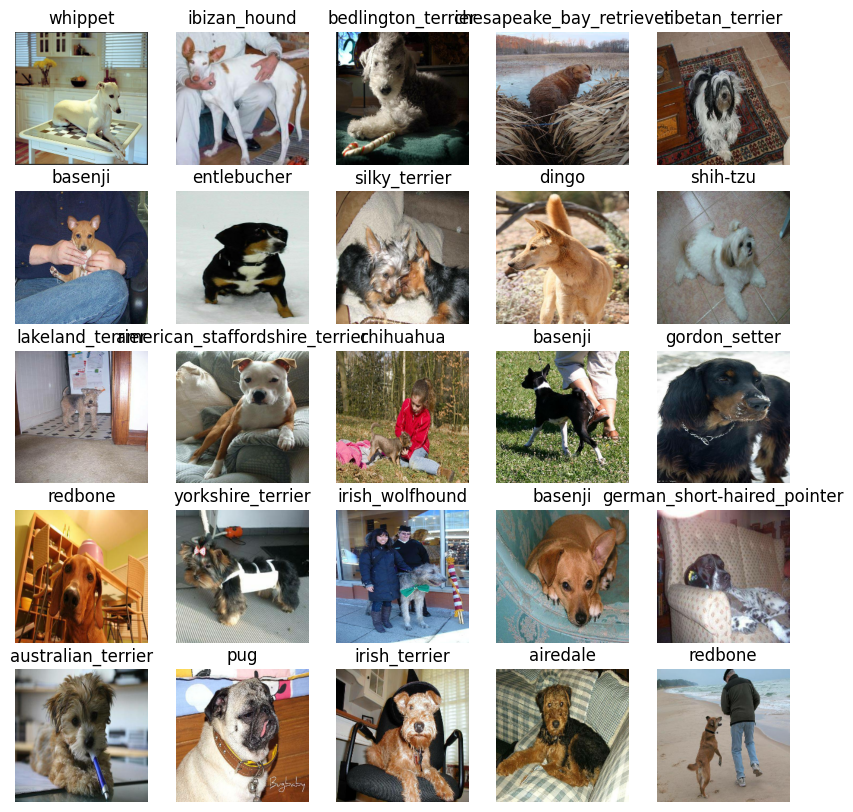

In [37]:
show_25_images(train_images,train_labels)

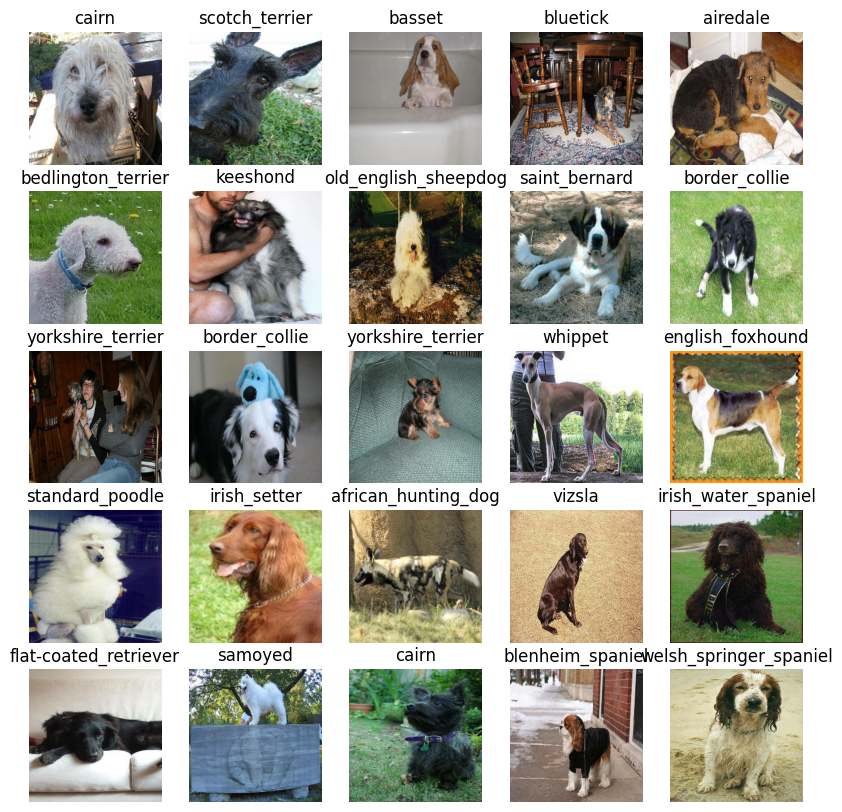

In [38]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Few things to define before building a model:
* The input shape (images shape, in the form of Tensors) to the model.
* The output shape (image labels, in the form of Tensors) of the model.
* The URL of the model that needs to be used.

In [39]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

In [40]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with: ", MODEL_URL)

    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    model.build(INPUT_SHAPE)

    return model

In [41]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callback Functions

### TensorBoard Callback

In [42]:
# Loading the TensorBoard notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Creating a function to build a TensorBoard callback

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/dog_vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [44]:
# Creating an early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience=3)

## Training a Model (on a subset of data)

The first model is going to train on only 1000 images, in order to make sure everything is working properly.

In [45]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

## Creating a function that trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model, passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks necessary to be used.
* Return the model.

In [46]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [47]:
model = train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 138s 5s/step - loss: 4.7111 - accuracy: 0.0900 - val_loss: 3.5667 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 2s 93ms/step - loss: 1.7192 - accuracy: 0.6750 - val_loss: 2.2825 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 2s 97ms/step - loss: 0.6032 - accuracy: 0.9325 - val_loss: 1.7712 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 3s 100ms/step - loss: 0.2620 - accuracy: 0.9887 - val_loss: 1.6193 - val_accuracy: 0.5600
Epoch 5/100
25/25 [==============================] - 2s 99ms/step - loss: 0.1522 - accuracy: 0.9975 - val_loss: 1.5219 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1016 - accuracy: 1.0000 - val_loss: 1.4752 - val_accuracy: 0.6250
Epoch 

## Checking TensorBoard Logs

In [48]:
%tensorboard --logdir drive/My\ Drive/dog_vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and Evaluating Predictions Using Trained Model

Making predictions on the validation data (not used to train on)

In [49]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 82ms/step


array([[3.43013293e-04, 1.75906913e-04, 3.42696812e-03, ...,
        6.78228505e-04, 1.21091638e-04, 2.62714410e-03],
       [1.27246301e-03, 5.03917749e-04, 4.14087530e-03, ...,
        1.96569265e-04, 4.45386628e-03, 6.04119967e-04],
       [5.27437442e-05, 6.37200137e-05, 8.93746037e-05, ...,
        1.03846305e-05, 3.20825211e-06, 4.06066742e-04],
       ...,
       [3.42037947e-06, 3.81099053e-05, 6.15268946e-05, ...,
        6.00753265e-05, 1.84674980e-04, 1.00782192e-04],
       [1.81373209e-03, 3.79442179e-04, 1.54469497e-04, ...,
        2.99118721e-04, 1.71032385e-04, 1.71115119e-02],
       [4.37875715e-05, 5.89557785e-05, 3.19042505e-04, ...,
        1.46383955e-03, 1.09646237e-03, 1.13532573e-04]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
np.sum(predictions[1])

1.0

In [53]:
len(y_val)

200

In [54]:
len(unique_breeds)

120

In [55]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.43013293e-04 1.75906913e-04 3.42696812e-03 7.70657934e-05
 1.61908931e-04 1.13079477e-04 1.34581886e-02 8.29591649e-04
 5.63046269e-05 9.02779051e-04 2.05259043e-04 5.40475245e-04
 2.89523072e-04 1.57732778e-04 4.93292813e-04 4.60777024e-04
 8.52278681e-05 3.55863541e-01 4.87258967e-06 1.24033730e-04
 1.71065435e-03 3.00123735e-04 4.90882985e-06 9.08135029e-04
 1.84062974e-05 3.64655396e-04 2.04704374e-01 6.19049752e-05
 1.55675027e-03 3.19982093e-04 3.41197359e-04 1.18791487e-03
 4.50220599e-04 8.52588346e-05 3.27051006e-04 5.29994955e-03
 3.34895994e-05 5.31798112e-04 2.86658207e-04 1.68983082e-04
 1.53687794e-03 4.05930477e-05 4.83157812e-04 3.38890532e-04
 1.61597854e-05 3.95430834e-05 2.38615685e-04 4.34118148e-04
 8.49027652e-04 8.91660384e-05 1.70432904e-04 2.59312565e-05
 2.53052916e-04 2.85397837e-05 5.73453108e-05 7.85003867e-05
 2.45708827e-04 9.08010267e-03 1.72322337e-03 2.88310070e-02
 1.38871651e-03 3.00355663e-04 5.77842467e-04 7.23228732e-06
 1.90421604e-04 3.475105

In [56]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [57]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [59]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

There are now ways to get:

* Prediction labels.
* Validation labels (truth labels).
* Validation images.

Create a function to make these more visual. The function will:

* Take an array of possibilities, an array of truth labels and an array of images and an integer.
* Convert the probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [60]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

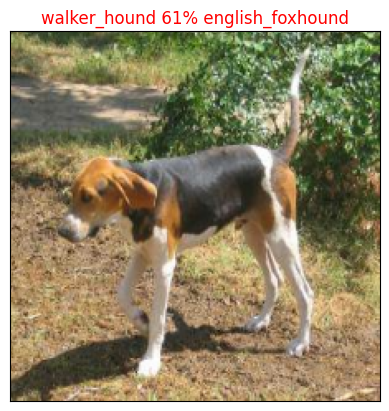

In [61]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=42)

  Creating a function to view top 10 predictions.
  
  The function will:
  * Take an array of possibilities, an array of truth labels and an integer.
  * Find the predicted label using `get_pred_label()`.
  * Find the top 10:
    * Prediction probabilities indexes.
    * Prediction probabilities values.
    * Prediction labels.
  * Plot the top 10 prediction probabilities values and labels, coloring the true label green.


In [62]:
def pred_plot_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

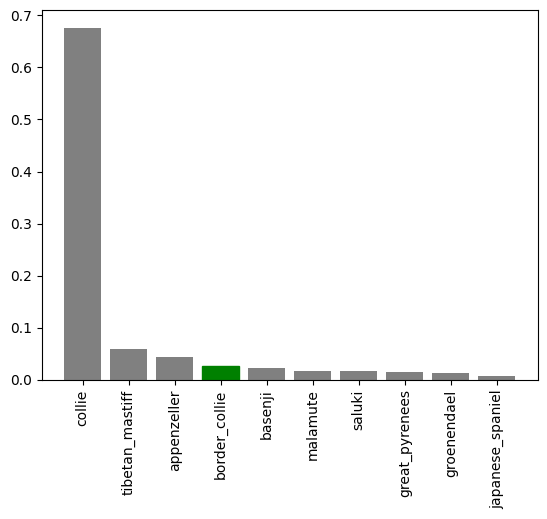

In [63]:
pred_plot_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

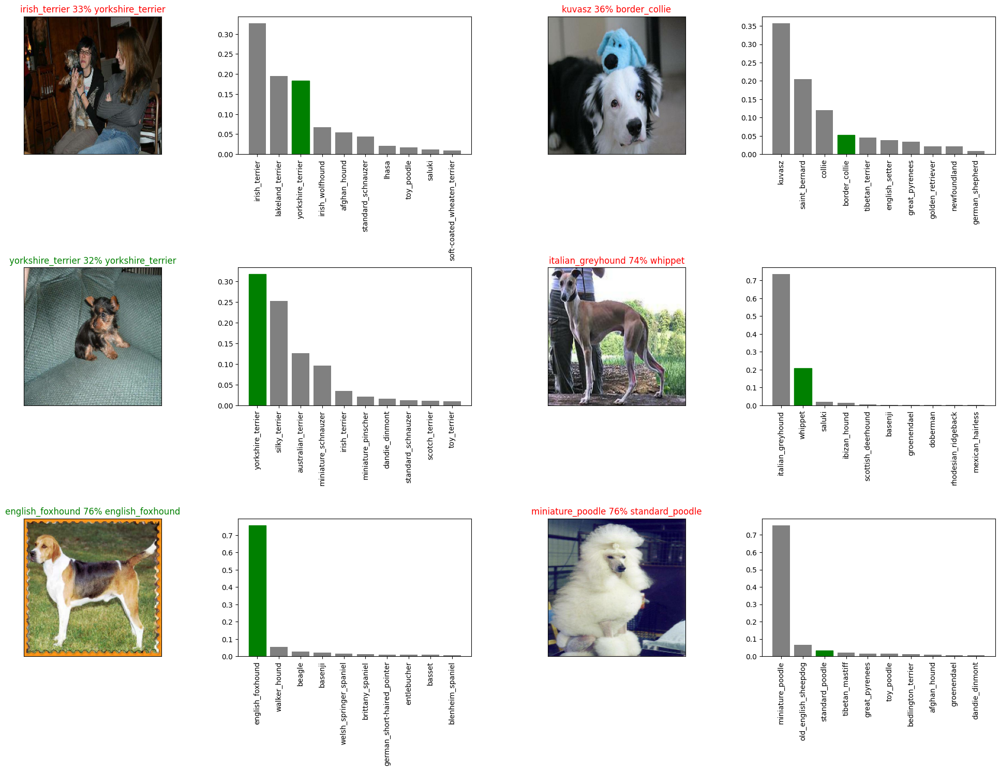

In [83]:
i_multiplier = 10
num_rows=3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  pred_plot_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and Reloading the Model

In [87]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/dog_vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [92]:
def load_model(model_path):
  print(f"Loading saved model from{model_path}")
  model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [90]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to drive/MyDrive/dog_vision/models/20240102-16411704213678-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog_vision/models/20240102-16411704213678-1000-images-mobilenetv2-Adam.h5'

In [96]:
loaded_model = load_model("drive/MyDrive/dog_vision/models/20240102-16411704213678-1000-images-mobilenetv2-Adam.h5")

Loading saved model fromdrive/MyDrive/dog_vision/models/20240102-16411704213678-1000-images-mobilenetv2-Adam.h5


In [97]:
model.evaluate(val_data)

7/7 [==============================] - 1s 114ms/step - loss: 1.3807 - accuracy: 0.6300


[1.3807320594787598, 0.6299999952316284]

In [98]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 4s 159ms/step - loss: 1.3807 - accuracy: 0.6300


[1.3807320594787598, 0.6299999952316284]

## Training a Model (on the full data)

In [99]:
len(X), len(y)

(10222, 10222)

In [100]:
X[:10]

['drive/MyDrive/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [101]:
y[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [102]:
len(X_train)

800

In [103]:
full_data = create_data_batches(X, y)

Creating training data batches


In [104]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [105]:
full_model = create_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [107]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [108]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 33s 83ms/step - loss: 1.3230 - accuracy: 0.6698
Epoch 2/100
320/320 [==============================] - 29s 89ms/step - loss: 0.4020 - accuracy: 0.8804
Epoch 3/100
320/320 [==============================] - 29s 90ms/step - loss: 0.2374 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 26s 83ms/step - loss: 0.1550 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 26s 81ms/step - loss: 0.1065 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0781 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 28s 87ms/step - loss: 0.0588 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 25s 79ms/step - loss: 0.0463 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 27s 85ms/step - loss: 0.0388 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 28s 87ms/step - l

In [109]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to drive/MyDrive/dog_vision/models/20240102-18051704218736-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog_vision/models/20240102-18051704218736-full-image-set-mobilenetv2-Adam.h5'

In [111]:
loaded_full_model = load_model("drive/MyDrive/dog_vision/models/20240102-18051704218736-full-image-set-mobilenetv2-Adam.h5")

Loading saved model fromdrive/MyDrive/dog_vision/models/20240102-18051704218736-full-image-set-mobilenetv2-Adam.h5


In [112]:
loaded_full_model

## Making Predictions on the Test Dataset

To make predictions on the test data:
* Get the image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data does not have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on the model.

In [116]:
test_path = "drive/MyDrive/dog_vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog_vision/test/e29f03a924c493b29d17877204dd0205.jpg',
 'drive/MyDrive/dog_vision/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/MyDrive/dog_vision/test/e6a5c18da7beedb1622bf7d18b452121.jpg',
 'drive/MyDrive/dog_vision/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/MyDrive/dog_vision/test/e47bc25097050ba689b64de02c725837.jpg',
 'drive/MyDrive/dog_vision/test/e65bf4e655ccf594210174f124e3adf0.jpg',
 'drive/MyDrive/dog_vision/test/e6f07d64c2380bbde03a7b6ade01b859.jpg',
 'drive/MyDrive/dog_vision/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 'drive/MyDrive/dog_vision/test/df4a5ab3464b937e11467c395ed190b9.jpg',
 'drive/MyDrive/dog_vision/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg']

In [117]:
len(test_filenames)

10357

In [118]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [123]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [124]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1306s 4s/step


In [127]:
np.savetxt("drive/MyDrive/dog_vision/preds_array.csv",
           test_predictions,
           delimiter=",")

In [128]:
test_predictions = np.loadtxt("drive/MyDrive/dog_vision/preds_array.csv", delimiter=",")

In [129]:
test_predictions[:10]

array([[2.44016141e-09, 5.12772158e-06, 1.25728289e-10, ...,
        4.38524651e-13, 4.96775492e-08, 3.15215920e-09],
       [2.17547802e-09, 9.01735575e-07, 3.55306788e-08, ...,
        5.50234311e-08, 1.67119492e-06, 1.32410782e-09],
       [1.06911195e-10, 4.45157522e-10, 6.21383639e-11, ...,
        1.42475143e-09, 5.51411521e-12, 1.12228105e-09],
       ...,
       [5.10767791e-07, 4.31883427e-06, 2.30262098e-09, ...,
        7.47769207e-08, 1.30255629e-09, 6.56289523e-10],
       [3.51239419e-11, 2.29262057e-13, 2.34353383e-14, ...,
        9.76386472e-11, 2.78043331e-07, 1.02846993e-11],
       [5.95198890e-12, 5.07835385e-14, 1.80102280e-10, ...,
        7.34386052e-10, 1.01362614e-12, 1.80628963e-14]])

In [130]:
test_predictions.shape

(10357, 120)

In [132]:
custom_path = "drive/MyDrive/dog_vision/dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

custom_image_paths

['drive/MyDrive/dog_vision/dog-photos/dog2.jpeg',
 'drive/MyDrive/dog_vision/dog-photos/dog1.jpeg',
 'drive/MyDrive/dog_vision/dog-photos/dog3.jpg']

In [133]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [135]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 853ms/step


In [137]:
custom_preds.shape

(3, 120)

In [138]:
custom_pred_labels =  [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_poodle', 'german_shepherd', 'pomeranian']

In [139]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

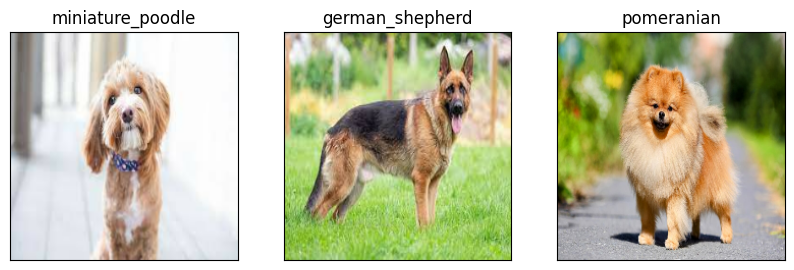

In [141]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)